<a href="https://colab.research.google.com/github/lucascionis/Colab-Notebooks/blob/main/Dinamica%20molecolare%20in%20Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Luca Scionis** - Università degli Studi di Cagliari

#Import delle librerie di supporto

In [ ]:
!pip install poisson-disc
!pip install --upgrade tbb #required to parallelize the code

Requirement already up-to-date: tbb in /usr/local/lib/python3.7/dist-packages (2021.2.0)


In [ ]:
import time
 
#compiling
import numba as nb
from numba import vectorize, guvectorize, prange, float64, int64
 
#math
import math
import numpy as np
from numpy.random import default_rng
import scipy.constants as const
from scipy.optimize import curve_fit
from scipy.stats import maxwell
from sklearn.metrics import mean_squared_error
 
import poisson_disc
 
#plotting
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib import rc
from mpl_toolkits.mplot3d import Axes3D
 
rng = default_rng()

#Breve introduzione alla dinamica molecolare

##Cos'è la dinamica molecolare?

La dinamica molecolare consente, attraverso una serie di tecniche computazionali, di **valutare l'evoluzione di un sistema fisico**/chimico a **livello atomico e molecolare**. Si parla di dinamica molecolare classica quando ci si riferisce al fatto che il moto delle particelle obbedisce alle leggi della meccanica classica. In una simulazione di dinamica molecolare si seguono alcuni passi fondamentali:

1.   Si definisce il sistema da studiare (es. N atomi di Argon);
2.   Si integrano le equazioni del moto per ogni particelle i-esima del sistema;
3.   Si termina la simulazione quando le proprietà del sistema non variano più nel tempo (quando si è raggiunto l'equilibrio).
4.   Si effettuano le misurazioni sui dati sperimentali raccolti.

Le misurazioni saranno affette da rumore statistico, per cui sarà necessario mediare i dati per un certo intervallo di simulazione, per ottenere dei risultati più accurati.

Fonte: D. Frenkel, B. Smit - Understanding Molecular Dynamics (San Diego, Calif., 2002)


##Come si può scrivere un programma di dinamica molecolare?

Dal punto di vista dell'implementazione su un elaboratore, un programma di dinamica molecolare può essere realizzato in maniera relativamente semplice. Esso è infatto costituito da una serie di blocchi ben definiti. Nello pseudocodice seguente è rappresentato in maniera sintetica un programma di dinamica molecolare:



```
initalize_system()

for t = 0 to steps-1:
  calc_forces(t)
  integrate_forces(f(t))
```

Nel programma non sono state considerati blocchi aggiuntivi che si occupano del calcolo di parametri intermedi nella simulazione. Può essere infatti necessario calcolare l'energia cinetica ad un certo step, per poi ricavare la temperatura istantanea. Nel caso in cui questo non venga fatto, il programma si riduce al calcolo delle forze e all'integrazione delle equazioni del moto per tutte le particelle del sistema.

Ovviamente ogni algoritmo di integrazione presenta un proprio errore locale e globale differente e si presta a differenti esigenze del sistema studiato. Alcuni algoritmi di integrazione, ad esempio, diventano instabili e inaccurati con un dt variabile.


#Considerazioni sull'errore di roundoff

Nella simulazione dello scattering di Rutherford avevo analizzato brevemente l'errore algoritmico del Velocity Verlet. In particolare l'errore globale associato al calcolo della posizione, che è dell'ordine di $O(\varDelta t^2)$.

Quando si effettuano delle simulazioni su un elaboratore è importante considerare anche l'errore introdotto dalla precisione macchina, ossia il cosìddetto **errore di roundoff**. La precisione macchina è il minimo numero, in modulo diverso da zero, che sommato all'unità dà un risultato diverso da 1.

Tramite la seguente funzione è possibile ottenere una rappresentazione approssimata della precisione macchina del calcolatore utilizzato.



In [ ]:
def approximate_machine_epsilon():
  epsilon = 1.0;
 
  while (1.0 + 0.5 * epsilon) != 1.0:
      epsilon = 0.5 * epsilon
 
  return epsilon

In [ ]:
epsilon = approximate_machine_epsilon()
print(epsilon)

2.220446049250313e-16


L'elaboratore su cui è stata eseguita questa funzione è a 64 bit per cui il risultato trovato è quello atteso: 2.220446e-16, ossia $2^{-52}$.

L'errore complessivo di roundoff, assumendo che gli errori si accumulino in modo casuale tra loro, per N operazioni è dato dalla seguente formulazione:
 
<p align="center">
$e_{roundoff} = \epsilon_m \sqrt{N}$
</p>
 
Si può verificare dunque con un plot l'andamento di questa espressione con la precisione macchina calcolata precedentemente ed un numero di steps che potrebbe essere utilizzato in una simulazione di dinamica molecolare, ad esempio 10000 steps.

In [ ]:
roundoff_error = lambda epsilon, N: epsilon * np.sqrt(N)

def print_roundoff_error(epsilon, N):
  fig, (ax, ax1) = plt.subplots(1,2)

  x = np.linspace(0, N, N//2);
  y = roundoff_error(epsilon, x)

  ax.plot(x,y,label="epsilon: {}, steps = {}".format(epsilon,N))
  ax.set_xlabel("Steps")
  ax.set_ylabel("Roundoff Error")
  ax.set_title("Errore di roundoff epsilon - scala lineare")
  ax.grid()
  ax.legend()

  ax1.loglog(x,y, label="epsilon: {}, steps = {}".format(epsilon,N))
  ax1.set_xlabel("Steps")
  ax1.set_ylabel("Roundoff Error")
  ax1.set_title("Errore di roundoff - scala loglog")
  ax1.grid()
  ax1.legend()

  fig.set_size_inches(15,5)
  plt.show()

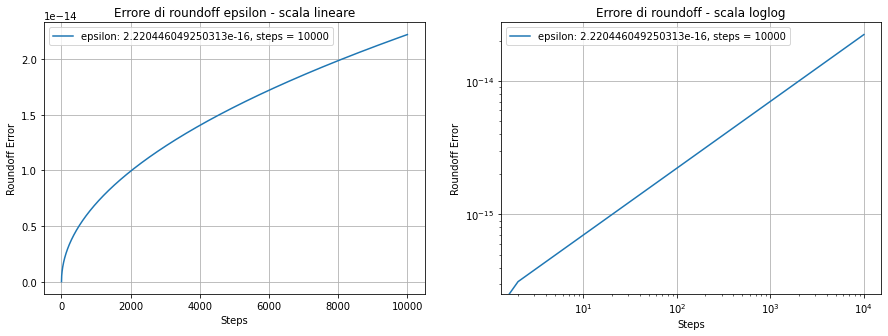

In [ ]:
print_roundoff_error(epsilon, int(10e3))

#Simulazione

###Potenziale di Lennard-Jones

Nella simulazione dello Scattering di Rutherford la funzione potenziale utilizzata era quella della forza di Coulomb. Quando si simula un sistema di particelle interagenti è necessario utilzzare una funzione che comprenda una serie di fenomeni attrattivi e repulsivi che avvengono tra gli atomi.

Il potenziale di Lennard-Jones è uno tra i potenziali più semplici e più noti per descrivere appunto questo tipo di interazioni. Esso è definito dalla seguente espressione:

<p align="center">
$U(r) = 4\varepsilon [(\frac{\sigma}{r})^{12} - (\frac{\sigma}{r})^6]$
</p>

Il potenziale LJ è la somma di due termini:


*   un termine attrattivo, l'interazione di Van der Waals, ossia: $4\varepsilon (\frac{\sigma}{r})^6$
*   un termine repulsivo, che prevale a corto raggio fra i nuclei: $4\varepsilon(\frac{\sigma}{r})^{12}$

Di sequito l'andamento del potenziale, fissati dei valori di epsilong e sigma unitari:

In [ ]:
def lj_potential(r, epsilon, sigma): 
  return 4*epsilon*((sigma/r)**12 - (sigma/r)**6)

In [ ]:
def plot_lj_potential(epsilon, sigma):
  fig, ax = plt.subplots()

  x = np.linspace(1, 2, 50)
  y = lj_potential(x, epsilon, sigma)

  ax.plot(x,y)
  ax.grid() 

  title = "Potenziale Lennard-Jones $\\epsilon$ =" + str(epsilon) + ", $\\sigma$ = " + str(sigma)
  ax.set_title(title)

  plt.show()

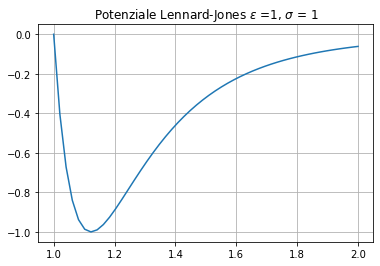

In [ ]:
plot_lj_potential(1,1)

Il termine epsilon determina la profondità della "buca" di potenziale; mentre il termine sigma rappresenta il raggio della sfera che approssima l'atomo.

####Definizione della forza di LJ

Per poter simulare un sistema di particelle usando il potenziale LJ è necessario calcolare l'espressione della forza. Come è noto, la forza si può ottenere dal gradiente del potenziale cambiato di segno:
 
<p align="center">
$\vec{F}(r) = -\nabla U(r) = -\frac{d}{dr}U(r) \hat{r} = 4\varepsilon (12\frac{\sigma^{12}}{r^{13}} - 6\frac{\sigma^{6}}{r^{7}})$
</p>
 
La rispettiva funzione python è:

In [ ]:
@nb.njit(fastmath=True, error_model='numpy')
def lj_force_cutoff_fast(r, epsilon, sigma, l):
  cutoff = 2.5*sigma
  if r < cutoff:
    return 48 * epsilon * np.power(sigma, 12) / np.power(r, 13) - 24 * epsilon * np.power(sigma, 6) / np.power(r, 7)
  else:
    return 0

 Il decoratore *@nb.njit* permette di indicare alla libreria numba di compilare la funzione in modalità "veloce".

###Altre funzioni di base

Di seguito definisco ulteriori funzioni necessarie per la simulazione, ossia:
 
*   *calc_norm_2D/3D*: calcolano la norma di un vettore bidimensionale/tridimensionale;
*   *check_PBC_image_jit*: attraverso la quale si implementa la convenzione della *minima-immagine* (descritta meglio successivamente);
*   *check_PBC_jit*: trasla all'interno della cella di simulazione le particelle le cui coordinate risultano al di fuori della cella.

In [ ]:
@vectorize(['float32(float32, float32, float32)'])
def calc_norm_3D(x,y,z):
  return math.sqrt(x**2 + y**2 + z**2)
 
@vectorize(['float32(float32, float32)'])
def calc_norm_2D(x,y):
  return math.sqrt(x**2 + y**2)
 
@nb.njit(error_model='numpy')
def check_PBC_image_jit(r, l):
  out = np.empty_like(r)
  return r - np.round(r / l, 0, out) * l
 
@nb.njit(fastmath=True, parallel=True, error_model='numpy')
def check_PBC_jit(r, s, l):
  for i in prange(r.shape[0]):
    for k in prange(r.shape[1]):
      if (r[i, k] > s+l): r[i, k] = r[i, k] - l
      if (r[i, k] <= s): r[i, k] = r[i, k] + l
  return r

Definisco qui una funzione per il calcolo della temperatura ad ogni istante della simulazione.

Calcolo l'energia cinetica media del sistema:
<p align="center">
$<E_k> = \sum_{N}{\frac{1}{2}mv_i^2}$
</p>

Da cui poi ricavo la temperatura, moltiplicando per $\frac{2}{dk_b}$, dove d è la dimensionalità del sistema, e $k_b$ il coefficiente di Boltzmann:
<p align="center">
$T_{inst} = \frac{2}{dk_b}<E_k>$
</p>

In [ ]:
def calculate_temp(v,dim,particles,mass):
  k_energy = 0.0
  
  for i in range(particles):
    k_energy = k_energy + 0.5*np.dot(v[i],v[i])
  
  mean_k_energy = mass * k_energy/particles
  temperature = 2 * mean_k_energy / (const.Boltzmann / 1.602e-19) * dim
  
  return temperature

####Condizioni periodiche al contorno

Le condizioni periodiche al contorno sono fondamentali in una simulazione di dinamica molecolare per poter approssimare un sistema molto largo (o infinito), utilizzando semplicemente una piccola unità, detta cella di simulazione. La cella può essere unitaria o avere una dimensione fissata in unità reali.
Ciò che si fa, nella pratica, consiste nel traslare le particelle che escono da un lato del box riportandole all'estremità opposta.
 
Il seguente pseudocodice descrive la più semplice e immediata implementazione delle condizioni periodiche (nel caso di cella di dimensione fissata x_length):
 
```
if (x < -x_length * 0.5) x = x + x_length
if (x >= x_length * 0.5) x = x - x_length
```
 
Durante la simulazione MD sarà necessario calcolare le inter-distanze tra particelle, per determinare le forze agenti su di esse. Anche questa distanza è affetta dalle condizioni periodiche; per implementare questa condizione ho utilizzato la convenzione della minima-immagine: ogni singola particella può interagire solo con l'immagine delle particelle rimanenti nel sistema. L'implementazione comune di questa convenzione è descritta con il seguente pseudocodice:
 
```
xij = x[j] - x[i]
xij = xij - nearbyint(xij / x_length) * x_length
```
 
Fonti:
 
https://en.wikipedia.org/wiki/Periodic_boundary_conditions
 
https://www.guangshi.io/posts/python-optimization-using-different-methods

###Velocity Verlet

Definisco inoltre le funzioni dell'algoritmo del Velocity Verlet, descritte più nel dettaglio nel primo esercizio.

In [ ]:
@nb.njit
def VV_new_pos_jit(p, v, a, dt):
  return p + v*dt + a * dt**2 *0.5
 
@nb.njit
def VV_new_vel_jit(v, a, a_next, dt):
  return v + (a + a_next) * dt * 0.5

###Inizializzazione delle particelle

####Posizioni iniziali

La scelta del **metodo di posizionamento iniziale** delle particelle è un punto critico e fondamentale per la buona riuscita della simulazione. Posizionare le particelle manualmente non è una scelta conveniente, dato il numero elevato; posizionarle attraverso una distribuzione randomica, può portare ad avere delle particelle che si sovrappongono, per cui sarebbe necessario verificare le singole distanze e generare delle nuove posizoni.
 
Una ulteriore possibilità è quella di utlizzare una griglia NxN, per cui la matrice delle coordinate deve essere quadrata; alcune simulazioni MD possono richiedere strutture rigide di questo tipo.
 
Per la mia simulazione ho ritenuto utile affidarmi ad una libreria open source accessiblie al seguente link, [poisson_disc_sampling](https://github.com/diregoblin/poisson_disc_sampling).
 
Questa libreria permette di effettuare un poisson disk sampling. Si tratta di un algoritmo che permette di posizionare in modo randomico gli N campioni da generare, facendo attenzione che ogni coppia di campioni sia ad una distanza (raggio) fissata.
 
Attraverso una serie di sperimentazioni ho trovato che una distanza ottimale è pari a sigma/2.

Di seguito un esempio del Poisson Disk sampling attraverso la libreria open-source:

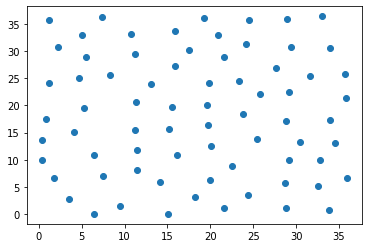

In [ ]:
rnd_distribution = poisson_disc.Bridson_sampling(dims=np.array([40-3.4,40-3.4]),radius=3.4)

plt.scatter(rnd_distribution[:,0], rnd_distribution[:,1])

####Velocità iniziali

Per questa simulazione di dinamica molecolare ho scelto di inizializzare le particelle con una velocità iniziale, per componente, pari a:
 
<p align="center">
$v_0 \simeq R \sqrt{\frac{2k_bT}{m}}$
</p>
 
dove R è un parametro casuale compreso tra -0.5 e +0.5; $k_b$ è la costante di Boltzmann, che in questa simualzione è espressa in $eV/K$; la massa di una singola particella è espressa in unità di massa atomiche, $amu$. Per cui le unità di misura della velocità sono espresse in $\sqrt{\frac{eV}{amu}}$.

In [ ]:
def init_vel(T, n_particles, mass, mono=False):
  '''
  T: initial temperature of the system
  n_particles: the number of particles
  mass: mass of each particle
  mono: if true initalizes generates n_particles equal speeds

  returns: np.array of n_particles velocities
  '''
  if (not mono):
    R = np.random.rand(n_particles) - 0.5
    velocities = R * np.sqrt(2 * (const.Boltzmann / 1.602e-19) * T / mass) #speed in sqrt(eV/amu)
  else:
    R = np.random.rand() - 0.5
    velocities = np.zeros(n_particles)
    velocities.fill(R)
  
  return velocities

La funzione completa di inizializzazione delle particelle è la seguente:

In [ ]:
def init_values(particles, dim, steps, start, L, init_temp, mass, mono=False):
  # NP arrays: (steps, particle, coordinate)
  v = np.zeros((particles, dim), dtype=np.float32)
  r = np.zeros((steps, particles, dim), dtype=np.float32)
 
  dist_min_rad = 0.5*3.46
  dist_dim = np.ones((dim), dtype=np.float32) * L-dist_min_rad
 
  # Le particelle vengono posizionate con un offset dall'origine pari al valore di start
  rnd_distribution = poisson_disc.Bridson_sampling(dist_dim, radius=dist_min_rad) + start
  rng.shuffle(rnd_distribution)
  
  # Assegno le posizioni nell'istante 0
  r[0] = rnd_distribution[:particles]
 
  # Inizializzo le velocità
  for i in range(dim):
    v[:, i] = init_vel(init_temp, particles, mass, mono)
 
  return r,v

Vengono inizializzati due array di posizioni e velocità. Per quanto riguarda le velocità, visto che ai fini della simulazione non è di interesse conservare le velocità istante per istante, si inizializza l'array solo per il numero di particelle del sistema. Per quanto riguarda le posizioni invece se ne tiene traccia ad ogni istante per effettuare successivamente il plot delle traiettorie.

Come detto precedentemente definisco il raggio minimo *dist_min_rad*, che costituisce la minima distanza tra due particelle, nel Poisson disk sampling. 

###Core della simulazione

Il calcolo delle forze, come si è discusso in precedenza, è un punto fondamentale della simulazione MD. A differenza dell'esercizio sullo Scattering, in cui le particelle non interagivano tra di loro, ma unicamente con l'atomo d'oro, in questa simulazione è differente. Ogni particella interagisce con le altre, ciò significa che ad ogni step è necessario calcolare le inter-distanze tra particelle.
 
Per un sistema di N particelle il numero di inter-distanze sarà dato dal valore del coefficiente binomiale $\begin{pmatrix} N \\ k\end{pmatrix}$ con k = 2.
 
Ad esempio, per N = 64 particelle, il numero di coppie (distanze da calcolare) sarà:
 
<p align="center">
$\begin{pmatrix} 64 \\ 2\end{pmatrix} = \frac{100!}{2! (100-2)!} = 2016$
</p>
 
Lo pseudocodice per effettuare il calcolo delle distanze è il seguente:
 
```
N = particles
 
for i = 0 to N:
 for j = 0 to N:
  if i != j:
    rij = r[j] - r[i]
    distance = norm(rij)
```
 
Il costrutto mostrato sopra presenta due cicli annidati per cui la complessità computazionale è di $O(N^2)$.
 
La componente scalare della distanza è necessaria per il calcolo della forza tra le due particelle. Si può arrivare subito alla conclusione che non è necessario ciclare sia nel ciclo esterno che quello interno per il numero intero di particelle ma sarà sufficiente seguire il pattern:
 
```
N = particles
 
for i = 0 to N-1:
 for j = i to N:
  rij = r[j] - r[i]
  distance = norm(rij)
```
 
In questo modo, per migliorare le performance, è possibile sfruttare la terza legge di Newton, calcolando solo la forza $F_{ij}$ da aggiungere alla somma delle forze sulla particella i e applicare alla particella j la forza $F_{ji} = -F{ij}$ (la forza sulla part. i cambiata di segno). In definitiva, il codice per il calcolo delle forze, diventa semplicemente:
 
 
```
N = particles
 
for i = 0 to N-1:
 for j = i to N:
  rij = r[j] - r[i]
  distance = norm(rij)
 
  force_on_i = force_on_i + lj_force(distance)
  force_on_j = force_on_j - force_on_i
```

La funzione scritta di seguito è implementata sulla base delle considerazioni precedenti:

In [ ]:
@nb.njit(fastmath=True, parallel=True, error_model='numpy')
def compute_forces(r, l):
  '''
  Note: actually the function works only with 2D and 3D
  
  r: np.array of positions at a certain step
  l: length of the box
 
  returns: forces acting on all particles at a step
  '''
  f = np.zeros((r.shape), dtype=np.float32)
  
  is_2D = r.shape[1] == 2
  is_3D = r.shape[1] == 3
 
  for i in prange(0, r.shape[0]-1):
    for j in prange(i+1, r.shape[0]):
      rij = r[i] - r[j]
      rij = check_PBC_image_jit(rij, l)
 
      if (is_2D):
        rij_abs = calc_norm_2D(rij[0], rij[1])
      elif (is_3D):
        rij_abs = calc_norm_3D(rij[0], rij[1], rij[2])
 
      force = lj_force_cutoff_fast(rij_abs, 0.0103, 3.46, l) * rij / rij_abs
 
      f[i] += force
      f[j] -= force
 
  return f

Definisco infine la funzione che permette di eseguire la simulazione di dinamica molecolare per intero. Prende in input una serie di parametri tra cui il numero di particelle, la dimensione del sistema, il timestep ecc.

Il fulcro della funzione è il pattern classico dell'algoritmo del Verlet, in aggiunta vi è anche la possibilità di effettuare il rescaling delle velocità per mantenere costante la temperatura sul valore fornito in input.
Anche in questo caso ho scelto di utilizzare degli array temporanei per salvare i risultati delle computazioni di un singolo step; questi verranno sovrascritti ad ogni iterazione, evitando di conservare in memoria dati che non erano fondamentali per questa simulazione. Le forze e le velocità ad ogni istante non vengono conservate. La funzione restituirà i valori istantanei delle posizioni e soltano le velocità all'istante finale.

In [ ]:
def run_MD(particles,dim,steps,dt,box_start,box_length,mass,init_temp,rescale_temp,mono=False):
  '''
  The main function of MD simulation
 
  particles: number of particles to simulate
  dim: is this a 2d or 3d system?
  steps: number of steps to simulate
  dt: the timestep
  box_start: where the bottom-left corner of the cell is located in the space
  box_length: the lenght of the simulation cell
  mass: the mass of each atoms
  init_temp: the inital temperature of the system
  rescale_temp: if true apply velocity rescaling
 
  return: r,v -> positions of each particle at every step, final velocities
  '''
  v0 = np.zeros((particles, dim), dtype=np.float32)
  v = np.zeros((particles, dim), dtype=np.float32)
  f = np.zeros((particles, dim), dtype=np.float32)
  tmp = np.zeros((particles, dim), dtype=np.float32)
  
  r,v = init_values(particles, dim, steps,box_start, box_length, init_temp, mass, mono)
  v0 = v.copy()

  f = compute_forces(r[0], box_length)
 
  for n in range(steps-1):
    r[n+1] = VV_new_pos_jit(r[n], v, f/mass, dt)
    r[n+1] = check_PBC_jit(r[n+1], box_start, box_length)
  
    if rescale_temp:
      # Calculate temperature
      temperature = calculate_temp(v,dim,particles,mass)
      # Rescale velocities
      v = v * np.sqrt(init_temp/temperature)
  
    tmp = f
    f = compute_forces(r[n+1], box_length)
    v = VV_new_vel_jit(v, tmp/mass, f/mass, dt)
 
  del f
  del tmp

  if (mono):
    v -= v0
 
  return r,v,v0

#Distribuzione delle velocità

In questa sezione definisco la funzione che utilizzerò per effettuare il fit della distribuzione delle velocità finali delle particelle simulate. La forma funzionale è la seguente:

<p align="center">
$P(v) = C\frac{v^2}{k_b T} e^{\frac{-m v^2}{2 k_b T}}$
</p>

Ricordando che, in questa simulazione, la costante di Boltzmann è espressa in $\frac{eV}{K}$, e le velocità sono espresse in $\sqrt{\frac{eV}{amu}}$. Il fit sarà eseguito sulla costante C, che dipende dalla massa della particelle e sul valore di $k_b T$. Il fit verrà inoltre eseguito la PDF di Maxwell-Boltzmann messa a disposizione dalla libreria scipy.

La funzione sottostante permette di calcolare la distribuzione delle velocità (essendo quantità vettoriali se ne calcola il modulo).

In [ ]:
def maxwell_boltzmann(v, C, kb_t):
  return C * (v**2)/kb_t * np.exp(-(mass_of_argon*v**2)/2*kb_t, dtype=np.float64)

In [ ]:
def plot_velocities_distribution(v, bins_number):
  '''
  This function plot the velocities distribution
  and fits it with maxwell function available
  through scipy library.
  
  v: array of particles velocities
 
  returns: maxwell distribution fit parameters
  '''
  particles = v.shape[0]

  speeds = np.linalg.norm(v, axis=1)
  
  counts, bins = np.histogram(speeds, bins=bins_number, density=True)
  bins = bins[1:] - (bins[1] - bins[0]) / 2
  
  scipy_fit_params = maxwell.fit(speeds)
  fit, cov = curve_fit(maxwell_boltzmann, bins, counts)
  
  fig, ax = plt.subplots()
  
  x = np.linspace(bins[0], bins[-1], particles)
  
  ax.hist(speeds, bins=bins, density=True)
  ax.plot(x, maxwell.pdf(x, *scipy_fit_params), lw=2, label = "Scipy fit")
  ax.plot(x, maxwell_boltzmann(x, *fit), label="C = {}, $k_b \cdot T = $ {}".format(*fit))
  
  ax.set_title("Velocities distribution")
  ax.set_ylabel("Probability density P(v)")
  ax.set_xlabel(r'Speed $\sqrt{eV/amu}$')

  ax.legend()

  print("From predefined function: C = {}, Kb*T = {}".format(*fit))
  print("Scipy fit's parameters: {}, {}".format(*scipy_fit_params))

  ax.grid()
  
  plt.show()
 
  return scipy_fit_params, fit

#Spostamento quadratico medio

Lo spostamento quadratico medio è la misura della deviazione, nel tempo, della posizione di una particella rispetto ad una posizione di riferimento (es. all'istante iniziale). La formulazione è la seguente:

<p align="center">
$\varDelta R(t)^2 = \frac{1}{N} \sum_{i=1}^N |r_i(t) - r_i(0)|^2$
</p>
 
Dove N è il numero di particelle del sistema. La somma è valutata per ogni particella ad ogni istante di tempo.

L'operazione è implementata attraverso la funzione calc_msd attraverso l'utilizzo di un'altra libreria, chiamata scikit learn, molto utilizzata nell'ambito scientifio e del machine learning.

In [ ]:
def calc_msd(r):
  msd = np.zeros(r.shape[0], dtype=np.float64)
  for t in range(1, r.shape[0]):
    msd[t] = mean_squared_error(r[t], r[0])
  return msd

Attraverso il calcolo dell'MSD si vorrebbe dimostrare che il moto dell'argon è diffusivo, ossia che:
 
<p align="center">
$\varDelta R(t)^2 \approx Dt$
</p>
 
dove D è il coefficiente di autodiffusione dell'argon. Il coefficiente D può essere calcolato attraverso la formula di Einstein:
 
<p align="center">
$D = \lim_{t\rightarrow \infty}\frac{\varDelta R(t)^2}{2dt}$
</p>
 
Dove d è la dimensionalità del sistema.
 
Come si vedrà dai risultati mostrati in seguito, le fluttuazioni (e quindi l'errore) del MSD sono particolarmente elevate. In questo caso, sarà sufficente cercare una zona lineare, nella prima parte del MSD, ed effettuare il fit per ottenere il valore del coefficiente angolare (m). Per cui la formulazione con il limite di sopra sarà approssimata come:
 
<p align="center">
$D = \frac{m}{2d}$ che ha unità $[\frac{Å^2}{dt}$, se dt = 0.1s $\rightarrow 10\frac{Å^2}{s}]$
</p>

Definisco le funzioni per effettuare il fit sui dati ottenuti dal calcolo del MSD.



In [ ]:
def plot_and_fit_msd(r, auto, fit_to_step, dt):
  '''
  This function plot the msd with fit and
  return fit's parameters.
  
  r: np.array of (steps, particles, dim)
  dt: timestep of simulation
  fit_to_step: the step where the fit ends

  returns: msd and fit's parameters
  '''

  diffusion = lambda t,m,b : m*t + b
  anomal_diff = lambda t, K, a : K*np.power(t, a)

  steps = r.shape[0]
  if (fit_to_step > steps):
    fit_to_step = steps

  msd = np.zeros(r[0].shape[0], dtype=np.float64)
  msd = calc_msd(r)

  fig, ax = plt.subplots()

  t = np.linspace(0, steps, steps)
  
  msd_cov = np.cov(msd)
  
  #Fit
  anomal_diff_fit, anomal_diff_cov = curve_fit(anomal_diff, t, msd)

  if (auto):
    fit_to_step = 10
    angular_coeff = 1

    while (angular_coeff > 0.2):
      diff_fit, diff_cov = curve_fit(diffusion, t[1:fit_to_step], msd[1:fit_to_step], absolute_sigma=msd_cov)
      angular_coeff = diff_fit[0]
      fit_to_step += 100
  else:
    diff_fit, diff_cov = curve_fit(diffusion, t[1:fit_to_step], msd[1:fit_to_step], absolute_sigma=msd_cov)
  
  #print(diff_fit)
  ax.plot(msd[1:])
  ax.plot(t, anomal_diff(t, anomal_diff_fit[0], anomal_diff_fit[1]))
  ax.plot(t[1:fit_to_step], diffusion(t[1:fit_to_step], *diff_fit))
  
  ax.set_title("Mean Squared Displacement")
  ax.set_ylabel(r'$\Delta R(t)^2 / Å^2$')
  ax.set_xlabel(r'Time / dt={}s'.format(dt))

  print("Angular coefficient: {}".format(diff_fit[0]))
  
  ax.grid()
  
  fig.set_tight_layout(tight=True)

  plt.show()

  return msd, diff_fit

In [ ]:
def evaluate_D(m, dim):
  '''
  m: the angular coefficient of msd fit in a linear region
  msd: the msd evaluated at last time step
  dim: the dimension of the system

  return: approximated self-diffusion coefficient [Å^2/dt]
  '''
  D_from_fit = np.abs(m)/(2*dim)
 
  print("Approximated self-diffusion coefficient: {}".format(D_from_fit))
  return D_from_fit

#Definizione delle funzioni di Plot

In conclusione definisco una serie di funzioni per poter eseguire il plot delle traiettorie delle particelle e visualizzarne una animazione sia in due che in tre dimensioni.

###Traiettorie in due dimensioni

In [ ]:
def MD_plot_trajectories_2D(r, dt):
  steps = r.shape[0]
  particles = r.shape[1]
  
  particles_to_plot = particles
  if (particles >= 64):
    particles_to_plot = particles // 2
  
  for i in range(particles_to_plot):
    plt.plot(r[:, i, 0], r[:, i, 1],'.', label='atom {}'.format(i))
  
  plt.grid()
  plt.xlabel(r'$X$ [Å]')
  plt.ylabel(r'$Y$ [Å]')
  plt.title("{}/{} Particles trajectories [steps={}, dt={}s]".format(particles_to_plot, particles, r.shape[0], dt))
  plt.show()

###Animazione in 2D

In [ ]:
def MD_animation_2D(r, dt, slow_factor=1):
  steps = r.shape[0]
  
  fig, ax = plt.subplots(figsize=(6,6))
  ax.set_title("MD simulation")
  ax.set_xlabel("X Axis")
  ax.set_ylabel("Y Axis")
  
  scat1 = ax.scatter(r[0,:,0], r[0,:,1], marker='o', s=20)
  
  def animate(i):
      scat1.set_offsets(r[i,:,:2])
  
  ani = animation.FuncAnimation(fig, animate, frames=range(0, int(steps), int(1/dt)), interval=dt*1e2*slow_factor)
  
  plt.close()
  
  rc('animation', html='html5')
  return ani

###Animazione in 3D

In [ ]:
def MD_animation_3D(r, dt, slow_factor=1):
  steps = r.shape[0]
  
  fig, ax = plt.subplots(figsize=(6,6))
  
  ax = Axes3D(fig)
  
  ax.set_title("MD simulation 3D")
  ax.set_xlabel("X Axis")
  ax.set_ylabel("Y Axis")
  ax.set_zlabel("Z Axis")

  scat1 = ax.scatter(r[0,:,0], r[0,:,1], r[0,:,2], marker='o', s=20)
  
  def animate(i):
      scat1._offsets3d = (r[i,:,0], r[i,:,1], r[i,:,2])
  
  ani = animation.FuncAnimation(fig, animate, frames=range(0, int(steps), int(1/dt)), interval=dt*1e2*slow_factor)
  
  plt.close()
  
  rc('animation', html='html5')
  return ani

#Run delle simulazioni

Prima di eseguire le simulazioni definisco la massa dell'argon:

In [ ]:
mass_of_argon = 39.948

e definisco una funzione che mi permette di eseguire una singola simulazione e farne alcune analisi automatiche (plot delle traiettorie, distribuzione delle velocità, calcolo dello spostamento quadratico medo).

In [ ]:
def sim_analyze_MD(sim_params, auto_fit_msd = False):
  '''
  sim_params: a dicitionary with all of MD parameters needed for the simulation
    i.e.:
    {
      "particles" : 64,
      "dim" : 2,
      "steps" : int(10e3),
      "dt" : 0.1,
      "box_start" : 0,
      "box_length" : 40,
      "mass" : mass_of_argon,
      "init_temp" : 300,
      "rescale_temp" : False
    }

  returns: positions, last step velocities, 
  maxwell_fit parameters of velocities distribution, the mean squared displacement,
  the approximanted self-diffusion coefficient
  '''
  r,v,v0 = run_MD(**sim_params)

  MD_plot_trajectories_2D(r, sim_params["dt"])
  
  _, maxwell_fit = plot_velocities_distribution(v, bins_number=40)
  msd, fit = plot_and_fit_msd(r, auto_fit_msd, 1000, sim_params["dt"])

  D_approx = evaluate_D(fit[0], sim_params["dim"])

  return r, v, v0, maxwell_fit, msd, D_approx

##Simulazione 0

In questa prima simulazione andrò a calcolare le traiettorie e le velocità finali di un sistema con:

*   N = 64 particelle
*   dimensionalità = 2
*   cella di simulazione = 20 $Å^2$
*   temperatura iniziale = 300K
*   n° steps = 10000
*   dt = 0.1 s
*   ditribuzione monomodale delle velocità = si
*   velocity rescaling = si

In [ ]:
sim0_params = {
    "particles" : 64,
    "dim" : 2,
    "steps" : int(10e3),
    "dt" : 0.1,
    "box_start" : 0,
    "box_length" : 40,
    "mass" : mass_of_argon,
    "init_temp" : 300,
    "rescale_temp" : False,
    "mono" : True
}

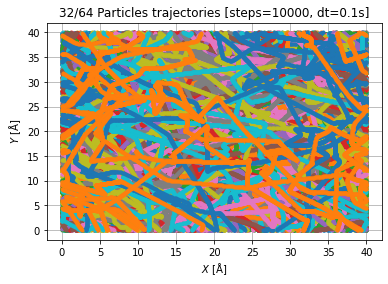

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


From predefined function: C = 1.5433893364462399, Kb*T = 0.1477518855355021
Scipy fit's parameters: -0.08804786898028275, 0.44034369965812914


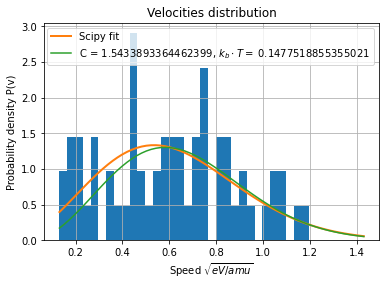

Angular coefficient: 0.22871862038513827


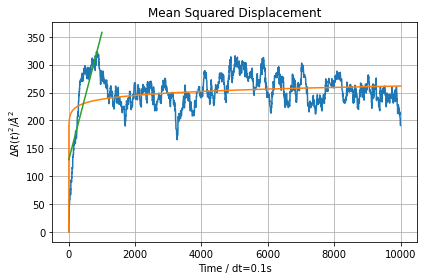

Approximated self-diffusion coefficient: 0.057179655096284566


In [ ]:
r0, v0, _, _, _, _= sim_analyze_MD(sim0_params, False)

Angular coefficient: 0.5501330525912059


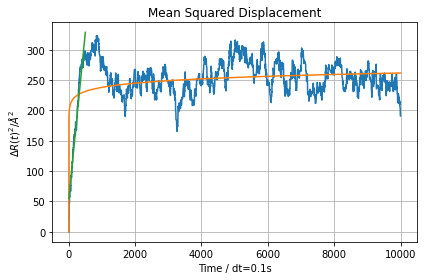

In [ ]:
msd0_manual, fit0_manual = plot_and_fit_msd(r0, False, 500, sim0_params["dt"])

In [ ]:
_ = evaluate_D(fit0_manual[0], sim0_params["dim"])

Approximated self-diffusion coefficient: 0.13753326314780148


## Simulazione 1

In questa prima simulazione andrò a calcolare le traiettorie e le velocità finali di un sistema con:

*   N = 64 particelle
*   dimensionalità = 2
*   cella di simulazione = 40 $Å^2$
*   temperatura iniziale = 300K
*   n° steps = 10000
*   dt = 0.1 s
*   ditribuzione monomodale delle velocità = no



###Senza velocity rescaling

In [ ]:
sim1_params = {
    "particles" : 64,
    "dim" : 2,
    "steps" : int(10e3),
    "dt" : 0.1,
    "box_start" : 0,
    "box_length" : 40,
    "mass" : mass_of_argon,
    "init_temp" : 300,
    "rescale_temp" : False,
    "mono" : False
}

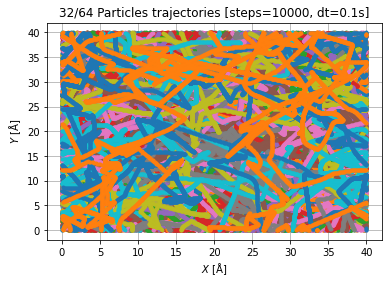

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


From predefined function: C = 1.6700970979287257, Kb*T = 0.15051632907020218
Scipy fit's parameters: -0.00352319785070670.4538793218396877


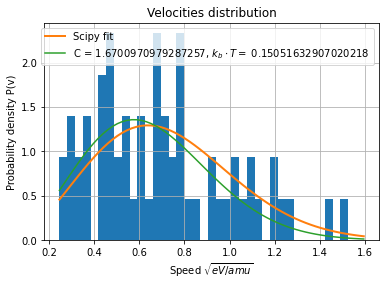

Angular coefficient: 0.16673304168704328


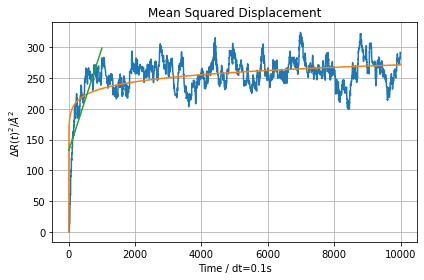

Approximated self-diffusion coefficient: 0.04168326042176082


In [ ]:
r, v, _, _, _, _= sim_analyze_MD(sim1_params, False)

Effettuo il fit del MSD impostando la regione manualmente:

Angular coefficient: 0.7118987136520276


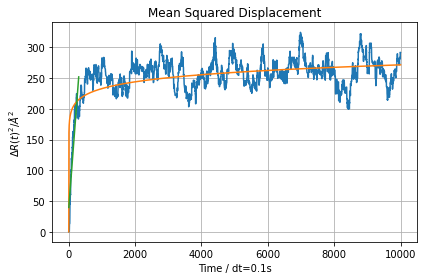

In [ ]:
msd1_manual, fit1_manual = plot_and_fit_msd(r, False, 300, sim1_params["dt"])

In [ ]:
_ = evaluate_D(fit1_manual[0], sim1_params["dim"])

Approximated self-diffusion coefficient: 0.1779746784130069


Vediamo l'animazione dell'intera simulazione, senza velocity rescaling:

In [ ]:
MD_animation_2D(r, sim1_params["dt"])

###Con velocity rescaling

In [ ]:
sim1_a_params = sim1_params.copy()
sim1_a_params["rescale_temp"] = True

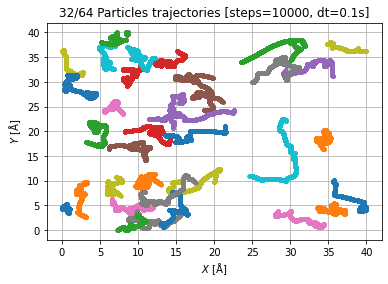

From predefined function: C = 162015244.04151428, Kb*T = 231.01506629691514
Scipy fit's parameters: 0.00014831663518168870.01031030320350235


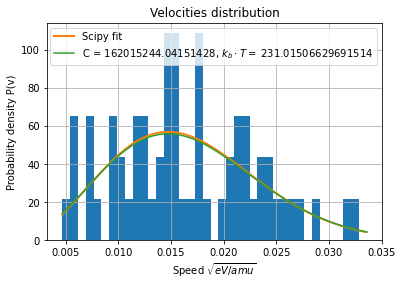

Angular coefficient: 0.0012448563881192047


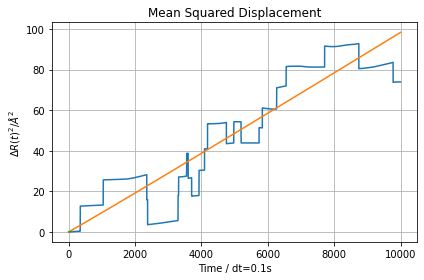

Approximated self-diffusion coefficient: 0.00031121409702980116


In [ ]:
r1a, v1a, _, _, msd1a, _= sim_analyze_MD(sim1_a_params, True)

In questa simulazione, osserviamo che le velocità sono in modulo più basse rispetto alla simulazione senza il controllo del termostato.

Per quanto riguarda il MSD, le particelle compiono uno spostamento complessivo minore, per cui i valori massimi di spostamento quadratico sono ridotti. Vediamo che il fit automatico copre una zona troppo ristretta. Definisco un range più ampio:

Angular coefficient: 0.009724654251408338


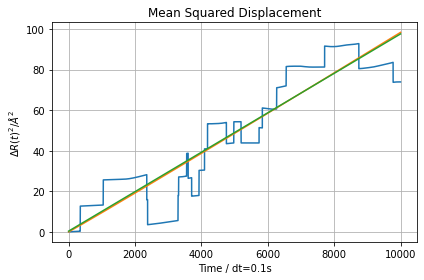

In [ ]:
msd1a_manual, fit1a_manual = plot_and_fit_msd(r1a, False, sim1_a_params["steps"], sim1_a_params["dt"])

In [ ]:
_ = evaluate_D(fit1a_manual[0], sim1_a_params["dim"])

Approximated self-diffusion coefficient: 0.0024311635628520845


Vediamo infine una animazione che mostra l'intera simulazione:

In [ ]:
MD_animation_2D(r1a, sim1_a_params["dt"])

## Simulazione 2

In questa seconda simulazione andrò a calcolare le traiettorie e le velocità finali di un sistema con:



*   N = 144 particelle
*   dimensionalità = 2
*   cella di simulazione = 40 $Å^2$
*   temperatura iniziale = 300K
*   n° steps = 10000
*   dt = 0.1 s
*   distribuzione monomodale = no

###Senza velocity rescaling

Senza applicare il velocity rescaling, le velocità iniziali sono troppo elevate dato il numero di particelle e le dimensioni del box. Per cui imposto 60 $Å^2$ invece che 40.

In [ ]:
sim2_params = {
    "particles" : 144,
    "dim" : 2,
    "steps" : int(10e3),
    "dt" : 0.1,
    "box_start" : 0,
    "box_length" : 60,
    "mass" : mass_of_argon,
    "init_temp" : 300,
    "rescale_temp" : False,
    "mono" : False
}

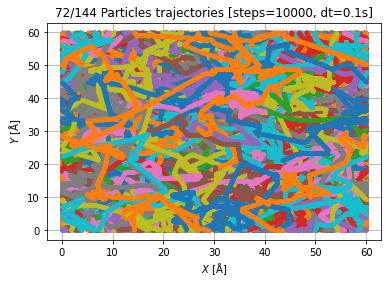

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


From predefined function: C = 4.730129833313281, Kb*T = 0.2348545565335215
Scipy fit's parameters: -0.11397466799941267, 0.39541966624773667


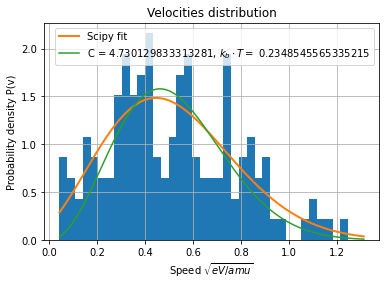

Angular coefficient: 0.3688495564412664


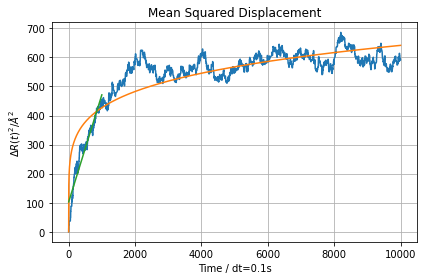

Approximated self-diffusion coefficient: 0.0922123891103166


In [ ]:
r2, v2, _, _, _, _= sim_analyze_MD(sim2_params, False)

Angular coefficient: 0.22607984560439365


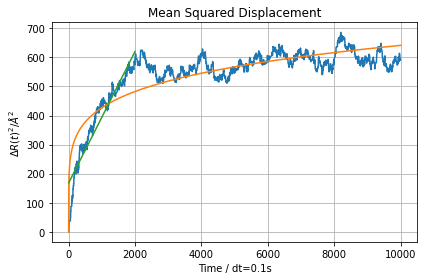

In [ ]:
msd2_manual, fit2_manual = plot_and_fit_msd(r2, False, 2000, sim2_params["dt"])

In [ ]:
_ = evaluate_D(fit2_manual[0], sim2_params["dim"])

Approximated self-diffusion coefficient: 0.05651996140109841


###Con velocity rescaling

In [ ]:
sim2a_params = sim2_params.copy()
sim2a_params["box_length"] = 40
sim2a_params["rescale_temp"] = True

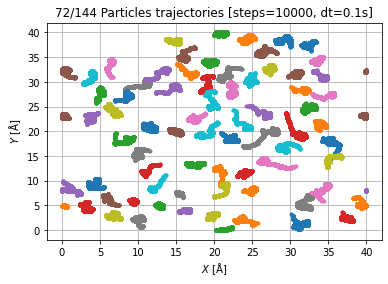

From predefined function: C = 217126780.96107614, Kb*T = 269.6938645247459
Scipy fit's parameters: -0.0020302611581467867, 0.011455458199015405


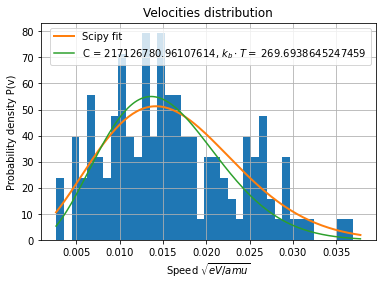

Angular coefficient: 0.016598170790434227


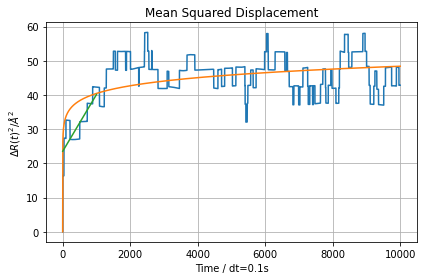

Approximated self-diffusion coefficient: 0.004149542697608557


In [ ]:
r2a, v2a, _, msd2a, _, _= sim_analyze_MD(sim2a_params, False)

In [ ]:
MD_animation_2D(r2a, sim2a_params["dt"])

##Simulazione 3

In questa terza simulazione andrò a calcolare le traiettorie e le velocità finali di un sistema con:



*   N = 64 particelle
*   dimensionalità = 3
*   cella di simulazione = 20 $Å^3$
*   temperatura iniziale = 300K
*   n° steps = 10000
*   dt = 0.1 s

###Senza velocity rescaling

In [ ]:
sim3_params = {
    "particles" : 64,
    "dim" : 3,
    "steps" : int(10e3),
    "dt" : 0.1,
    "box_start" : 0,
    "box_length" : 20,
    "mass" : mass_of_argon,
    "init_temp" : 300,
    "rescale_temp" : False,
    "mono" : False
}

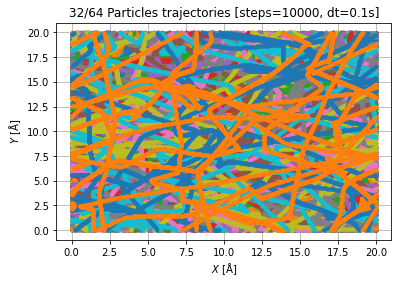

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


From predefined function: C = 7.460047025914497, Kb*T = 0.26172065653562604
Scipy fit's parameters: 0.0019922330365906046, 0.2967775880335863


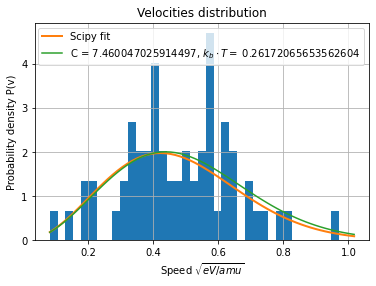

Angular coefficient: 0.06726353609967073


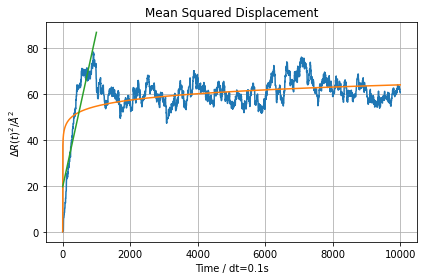

Approximated self-diffusion coefficient: 0.011210589349945121


In [ ]:
r3, v3, _, msd3, _, _= sim_analyze_MD(sim3_params, False)

In [ ]:
MD_animation_3D(r3, sim3_params["dt"])

###Con velocity rescaling

In [ ]:
sim3a_params = sim3_params.copy()
sim3a_params["rescale_temp"] = True

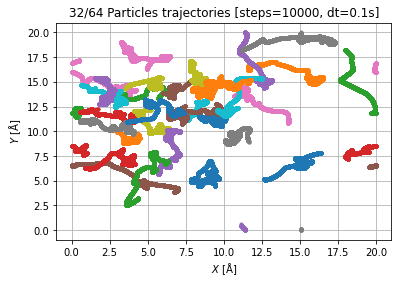

From predefined function: C = 455539229.5774249, Kb*T = 360.82546096846363
Scipy fit's parameters: -0.0009693575346160494, 0.008989315361661495


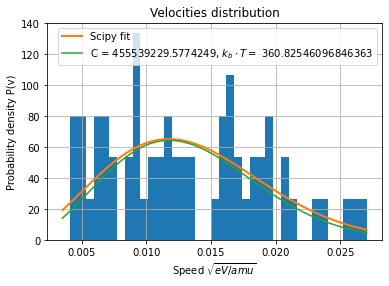

Angular coefficient: 0.01216721111532055


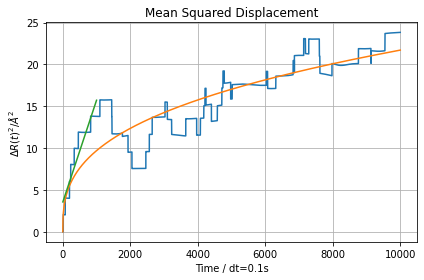

Approximated self-diffusion coefficient: 0.0020278685192200918


In [ ]:
r3a, v3a, _, msd3a, _, _= sim_analyze_MD(sim3a_params, False)

Per quanto riguarda la distribuzione delle velocità finali, non vi è molta differenza con ciò che si è ottenuto nelle simulazioni in due dimensioni.

Mentre per quanto riguarda l'andamento dell'MSD si può osservare come, aggiungendo la terza dimensione, esso sia tendenzialmente più lineare; più simile dunque a ciò che si aspetterebbe dall'evoluzione di un sistema reale.

Effettuando il fit sull'intero intervallo si ottiene il seguente risultato:

Angular coefficient: 0.0014682429751637469


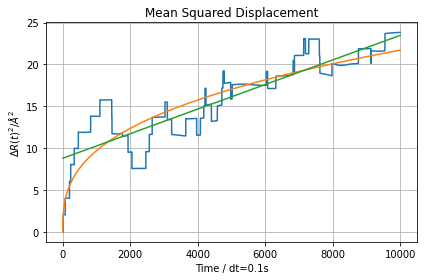

In [ ]:
msd3a_manual, fit3a_manual = plot_and_fit_msd(r3a, False, sim3a_params["steps"], sim3a_params["dt"])

In [ ]:
_ = evaluate_D(fit3a_manual[0], sim3a_params["dim"])

Approximated self-diffusion coefficient: 0.00024470716252729115


In [ ]:
MD_animation_3D(r3a, sim3a_params["dt"])

##Simulazione 4

In questa quarta simulazione andrò a calcolare le traiettorie e le velocità finali di un sistema con:



*   N = 300 particelle
*   dimensionalità = 3
*   cella di simulazione = 40 $Å^3$
*   temperatura iniziale = 373K
*   velocity rescaling = si
*   n° steps = 10000
*   dt = 0.05 s

In [ ]:
sim4_params = {
    "particles" : 300,
    "dim" : 3,
    "steps" : int(10e3),
    "dt" : 0.05,
    "box_start" : 0,
    "box_length" : 40,
    "mass" : mass_of_argon,
    "init_temp" : 373,
    "rescale_temp" : True,
    "mono" : False
}

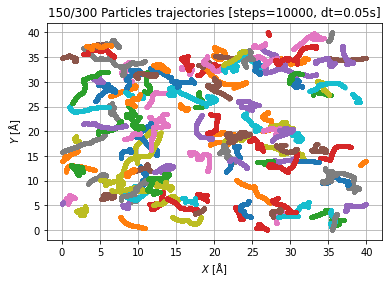

From predefined function: C = 238902844.61005056, Kb*T = 266.74442873286995
Scipy fit's parameters: 0.0006809792892049919, 0.00909222468604534


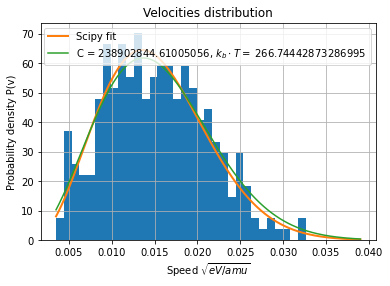

Angular coefficient: 0.010989974747768083


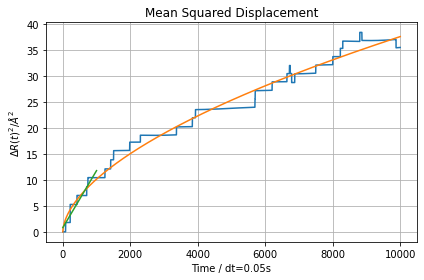

Approximated self-diffusion coefficient: 0.0018316624579613472


In [ ]:
r4, v4, _, msd4, _, _= sim_analyze_MD(sim4_params, False)

Come si può osservare dal grafico della distribuzione delle velocità sopra, l'andamento dell'istogramma segue in maniera pressochè accurata quello della curva di Maxwell-Boltzmann.

Angular coefficient: 0.003184294660976361


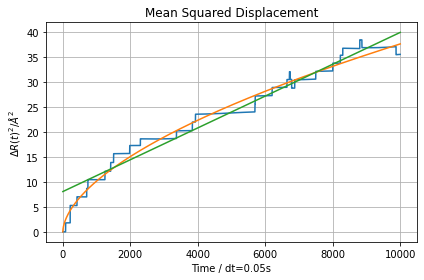

In [ ]:
msd4_manual, fit4_manual = plot_and_fit_msd(r4, False, sim4_params["steps"], sim4_params["dt"])

In [ ]:
_ = evaluate_D(fit4_manual[0], sim4_params["dim"])

Approximated self-diffusion coefficient: 0.0005307157768293935


In [ ]:
MD_animation_3D(r4, sim4_params["dt"])

Infine, eseguo la stessa simulazione di sopra, ma con un dt maggiore (a discapito della stabilità del Verlet) e con un numero di step doppio:

In [ ]:
sim4a_params = {
    "particles" : 300,
    "dim" : 3,
    "steps" : int(20e3),
    "dt" : 0.1,
    "box_start" : 0,
    "box_length" : 40,
    "mass" : mass_of_argon,
    "init_temp" : 373,
    "rescale_temp" : True,
    "mono" : False
}

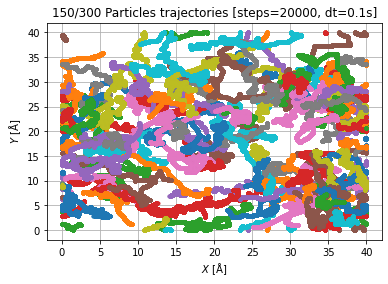

From predefined function: C = 269543930.44504386, Kb*T = 283.79676340814916
Scipy fit's parameters: -0.00018921299725731906, 0.009554585450193987


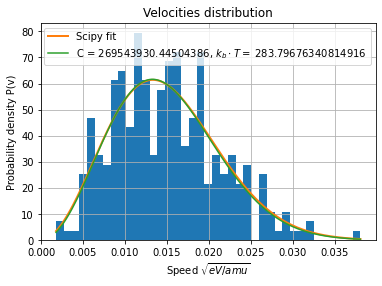

Angular coefficient: 0.016871652913675345


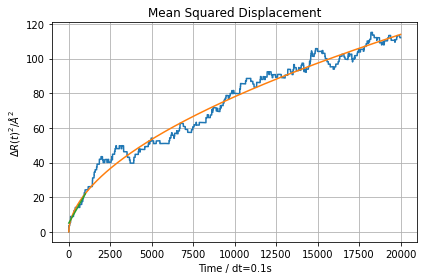

Approximated self-diffusion coefficient: 0.002811942152279224


In [ ]:
r4a, v4a, _, msd4a, _, _= sim_analyze_MD(sim4a_params, False)

Angular coefficient: 0.004731417499648338


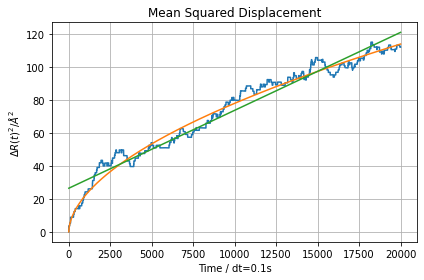

In [ ]:
msd4a_manual, fit4a_manual = plot_and_fit_msd(r4a, False, sim4a_params["steps"], sim4a_params["dt"])

In [ ]:
_ = evaluate_D(fit4a_manual[0], sim4a_params["dim"])

Approximated self-diffusion coefficient: 0.000788569583274723


In [ ]:
MD_animation_3D(r4a, sim4a_params["dt"])